In [1]:
import torchvision
import torch
import torch.nn as nn
import numpy as np
from torch import optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from sklearn.model_selection import train_test_split
import os
from skimage import io
import time
import ast 
from PIL import *
from torchvision import transforms
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [2]:
if torch.cuda.is_available:
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# subset / old csv
# df = pd.read_csv('temp.csv')

# area larger than 1000
df = pd.read_csv('area_larger_than_1000.csv')

# full dataset 
# df = pd.read_csv('large_nodules_png_bounding_box.csv')

# subset of dataset (25%)
# _ , X_random, = train_test_split(df, test_size=0.25, random_state=0)
# X_random.to_csv('subset.csv',index=False)
# df = X_random

# df.iloc[0,0]

# delete smaller boxes
# df = pd.read_csv('large_nodules_png_bounding_box.csv')
# df_filtered = df[df['areas'] >= 50]  
# df_filtered.to_csv("df_filtered.csv", index = False)
# df = pd.read_csv("df_filtered.csv")
df

,path,imageName,SOPInstanceUID,boxes,areas
0,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000172.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.358253510231...,"[[337.0, 189.0, 376.0, 224.0]]",1365.0
1,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000174.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.332771657417...,"[[335.0, 186.0, 375.0, 225.0]]",1560.0
2,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000019.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.133221309761...,"[[333.0, 189.0, 369.0, 219.0]]",1080.0
3,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000175.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.291261298826...,"[[334.0, 189.0, 374.0, 218.0]]",1160.0
4,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000033.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.122854262319...,"[[112.0, 139.0, 156.0, 189.0]]",2200.0
...,...,...,...,...,...
471,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000119.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.787525847146...,"[[316.0, 313.0, 350.0, 349.0]]",1224.0
472,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000081.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.216953803063...,"[[319.0, 307.0, 350.0, 344.0]]",1147.0
473,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000056.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.182307837643...,"[[313.0, 308.0, 352.0, 346.0]]",1482.0
474,/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-I...,000056.png,1.3.6.1.4.1.14519.5.2.1.6279.6001.182307837643...,"[[181.0, 173.0, 208.0, 211.0]]",1026.0


In [4]:
print(max(df['areas']), min(df['areas']))

2880.0 1008.0


In [5]:
# split dataset into 60, 20, 20 
train_data, test_data = train_test_split(df, test_size=0.40, random_state=2020)
valid_data, test_data = train_test_split(test_data, test_size=0.50, random_state=2020)
train_data.index = np.arange(len(train_data))
valid_data.index = np.arange(len(valid_data))
test_data.index = np.arange(len(test_data))

In [6]:
train_data.to_csv("large_nodules_train.csv", index=False)
valid_data.to_csv("large_nodules_valid.csv", index=False)
test_data.to_csv("large_nodules_test.csv", index=False)

In [7]:
from torchvision import transforms
# torchvision models are trained on input images normalized to [0 1] range .ToPILImage() function achives this
# additional normalization is required see: http://pytorch.org/docs/master/torchvision/models.html

train_transform = transforms.Compose([
        transforms.ToPILImage(),
#         transforms.RandomResizedCrop(512),
        transforms.CenterCrop(512),
#         transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

validation_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.CenterCrop(512),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

class Faster_RCNN_Dataloader(Dataset):
    """Chest X-ray dataset from https://nihcc.app.box.com/v/ChestXray-NIHCC."""

    def __init__(self, csv_file, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file filename information.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data_frame = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        
        # get image path
        img_name = (self.data_frame.iloc[idx, 0])
        
#         # open image 
#         image = io.imread(img_name)
#         # 3 channels
#         image = np.array(image)
        image = cv2.imread(img_name) # Read image with cv2
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         plt.imshow(image)
        
#         if len(image.shape) > 2 and image.shape[2] == 4:
#             image = image[:,:,0]       
#         image = np.repeat(image[None,...],3,axis=0)
        
        # transform image? 
#         plt.imshow(image)
        d = {}
        
        if self.transform:
            image = self.transform(np.uint8(image))
            d['boxes'] = torch.FloatTensor(ast.literal_eval(self.data_frame.iloc[idx, 3]))
            d['labels'] = torch.ones([1], dtype=torch.int64)
#             d['labels'] = torch.ones((1, 1),  dtype=torch.int64)
#         plt.imshow(image.squeeze().numpy())
        else:
            d['boxes'] = torch.FloatTensor(ast.literal_eval(self.data_frame.iloc[idx, 3]))
            d['labels'] = torch.ones([1], dtype=torch.int64)

        
        return image, d

# change dataloader output to lists.
def pad_collate(batch):
    (xx, yy) = zip(*batch)
    return list(xx), list(yy)

In [8]:
train_df_path = 'large_nodules_train.csv'
validate_df_path = 'large_nodules_valid.csv'
test_df_path = 'large_nodules_test.csv'

transformed_dataset = {'train': Faster_RCNN_Dataloader(train_df_path, transform=train_transform),
                       'validate':Faster_RCNN_Dataloader(validate_df_path, transform=validation_transform),
                       'test':Faster_RCNN_Dataloader(test_df_path)}
bs = 8

dataloader = {x: DataLoader(transformed_dataset[x], batch_size=bs,
                        shuffle=True, collate_fn = pad_collate, num_workers=0) for x in ['train', 'validate','test']}
data_sizes ={x: len(transformed_dataset[x]) for x in ['train', 'validate','test']}


# one dataloader / phase, may be too memory intensive...

# train_dataset = {'train': Faster_RCNN_Dataloader(train_df_path, transform=train_transform)}
# validate_dataset = {'validate': Faster_RCNN_Dataloader(validate_df_path, transform=validation_transform)}
# test_dataset = {'test': Faster_RCNN_Dataloader(test_df_path)}

# bs = 16 #if bigger, running out of memory in p100

# train_dataloader = {x : DataLoader(train_dataset[x], batch_size=bs,
#                         shuffle=True,collate_fn = pad_collate, num_workers=0) for x in ['train']}
# validate_dataloader = {x : DataLoader(validate_dataset[x], batch_size=bs,
#                         shuffle=True,collate_fn = pad_collate, num_workers=0) for x in ['validate']}
# test_dataloader = {x : DataLoader(test_dataset[x], batch_size=bs,
#                         shuffle=True,collate_fn = pad_collate, num_workers=0) for x in ['test']}
# data_sizes ={len(dataset[x]) for x in ['train']}

PNG
(512, 512)
L


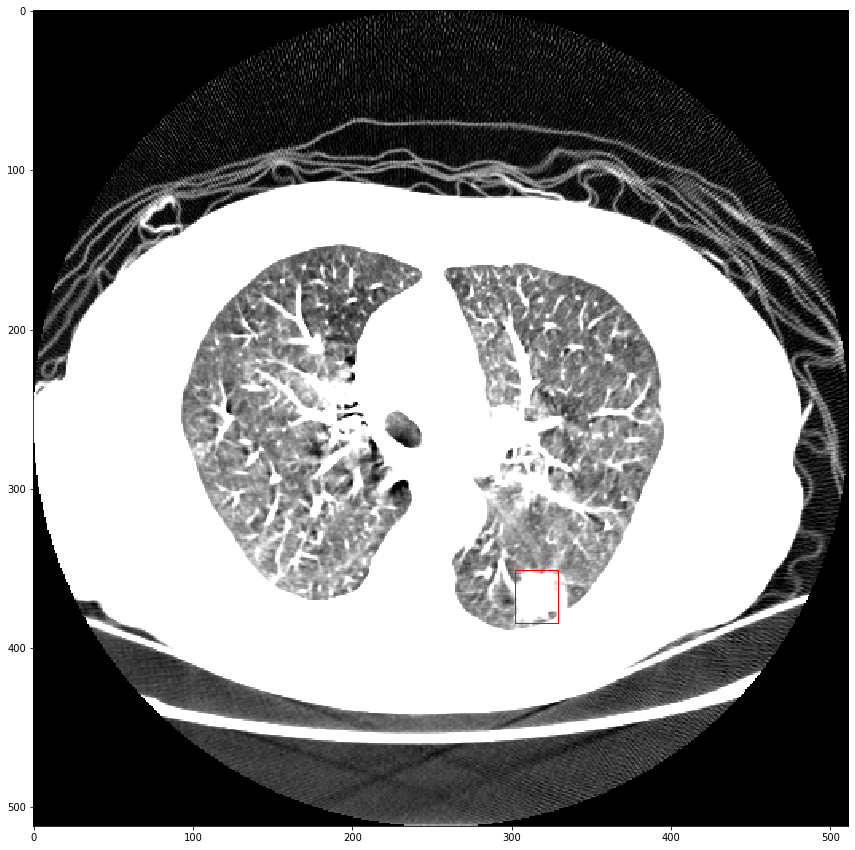

In [9]:
image = Image.open("/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-IDRI-0001/01-01-2000-30178/3000566-03192/000030.png")
# plt.imshow(image, cmap="bone")
print(image.format)
print(image.size)
print(image.mode)

path = '/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-IDRI-0001/01-01-2000-30178/3000566-03192/000030.png'
boxes = "[[302.0, 351.0, 329.0, 384.0]]"

def box_png(path, boxes):
    boxes = ast.literal_eval(boxes)
    for i in boxes:
            ymin, ymax = i[1],i[3] #ymin ymax        
            xmin, xmax = (i[0]), (i[2]) #xmin, xmax
#     im = np.array(Image.open(path), dtype=np.uint8)
    image = cv2.imread(path) # Read image with cv2
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig,ax = plt.subplots(1, figsize=(15,15))
    ax.imshow(image, cmap='gray')
    rect = patches.Rectangle((xmin, ymin ),(xmax - xmin),(ymax - ymin),linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    plt.show()
    
box_png(path, boxes)

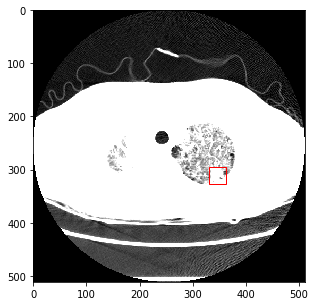

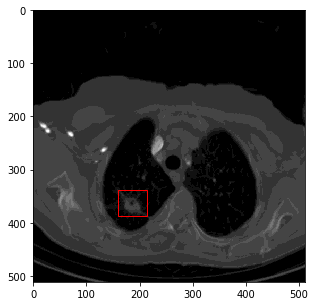

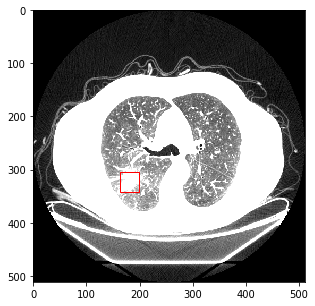

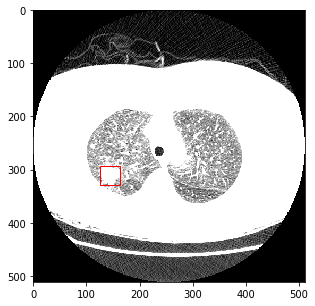

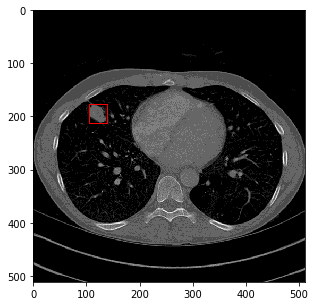

...

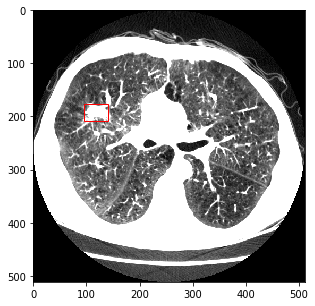

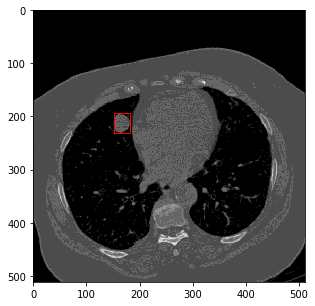

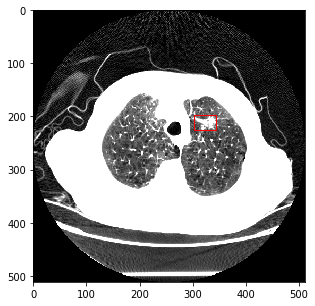

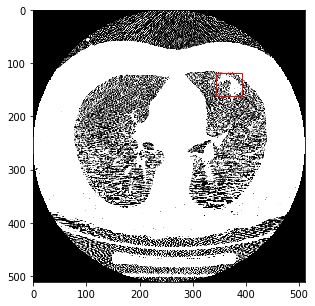

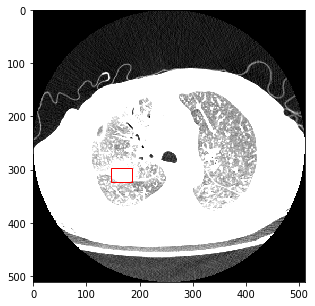

In [10]:
# check if dataloader loaded correctly
# images1, targets1 = next(iter(train_dataloader['train']))
# images2, targets2 = next(iter(validate_dataloader['validate']))
# images3, targets3 = next(iter(test_dataloader['test']))

# to check dim of list dataloader
# len(images) = batch
# len(images[0]) = channel
# len(images[0]) = height
# len(images[0]) = width

# testing dataloader 
images4, targets4 = next(iter(dataloader['train']))

# for i in targets4[0]['boxes'].numpy():
#     ymin, ymax = i[1],i[3] #ymin ymax        
#     xmin, xmax = i[0], i[2] #xmin, xmax
# fig,ax = plt.subplots(1, figsize=(5,5))
# ax.imshow(images4[0][1].squeeze().numpy(), cmap='gray')
# rect = patches.Rectangle((xmin, ymin ),(xmax - xmin),(ymax - ymin),linewidth=1,edgecolor='r',facecolor='none')
# ax.add_patch(rect)
# plt.show()

for images, targets in dataloader['train']:
    for i in targets[0]['boxes'].numpy():
        ymin, ymax = i[1],i[3] #ymin ymax        
        xmin, xmax = i[0], i[2] #xmin, xmax
        fig,ax = plt.subplots(1, figsize=(5,5))
        ax.imshow(images[0][1].squeeze().numpy(), cmap='gray')
        rect = patches.Rectangle((xmin, ymin ),(xmax - xmin),(ymax - ymin),linewidth=1,edgecolor='r',facecolor='none')
        ax.add_patch(rect)
        plt.show()

In [11]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# replace the classifier with a new one, that has
# num_classes which is user-defined
num_classes = 2  # 1 class (nodule) + background

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [12]:
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features

# FasterRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios

# anchor_generator = AnchorGenerator(sizes=((4, 8, 16, 32, 36, 40, 48, 49, 56, 64, 72),),
#                                    aspect_ratios=((0.25, 0.5, 0.75, 1.0, 1.25, 1.5),))

# areas > 1000
anchor_generator = AnchorGenerator(sizes=((36, 40, 48, 49, 56, 64, 72),),
                                   aspect_ratios=((.75, 1.0, 1.25, 1.5),))

# anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
#                                    aspect_ratios=((0.5, 1.0, 2.0),))

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=["0"],
                                                output_size=7,
                                                sampling_ratio=2)

model = FasterRCNN(backbone,
                   num_classes=2,
                   rpn_anchor_generator=anchor_generator,
                   box_roi_pool=roi_pooler,
                   rpn_nms_thresh = .9).to(device)

# tried to run not pretrained.
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(num_classes=2).to(device)

# for multiple nodes
torch.nn.DataParallel(model)


optimizer = torch.optim.SGD(model.parameters(), lr=1e-5,
                                momentum=0.9, weight_decay=1e-5)

# optimizer = torch.optim.SGD(model.parameters(), lr=0.00001, momentum=0.9, weight_decay=0.0005)

lambda_func = lambda epoch: 0.5 ** epoch
scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda_func)

# unused 
cel = nn.MSELoss() 

In [13]:
# move dict/lists to gpu 
def move_to(obj, device):
    if torch.is_tensor(obj):
        return obj.to(device)
    elif isinstance(obj, dict):
        res = {}
        for k, v in obj.items():
            res[k] = move_to(v, device)
        return res
    elif isinstance(obj, list):
        res = []
        for v in obj:
            res.append(move_to(v, device))
        return res
    else:
        raise TypeError("Invalid type for move_to")

In [14]:
classes = ['__background__', 'nodule']

In [15]:
def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(float(boxA[0]), float(boxB[0]))
    yA = max(float(boxA[1]), float(boxB[1]))
    xB = min(float(boxA[2]), float(boxB[2]))
    yB = min(float(boxA[3]), float(boxB[3]))
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou

In [16]:
def train_model(model, dataloader,optimizer, scheduler, loss_fn, num_epochs = 10, verbose = True):
    acc_dict = {'train':[]}
    loss_dict = {'train':[], 'validate':[]}
    best_acc = 0
    phases = ['train','validate']
    since = time.time()
    epochLossTrain = list()
#     epochAccTrain = list()
#     epochLossValidate = list()
    epochAccValidate = list()
    epochAccBestScore = list()
    for i in range(num_epochs):
        print('Epoch: {}/{}'.format(i, num_epochs-1))
        print('-'*10)
        losslist = []
        for p in phases:
            running_correct = 0
            running_loss = 0
            running_total = 0
            maxIOUs = [0]
            bestScore = [0]
            if p == 'train':
                model.train()
            else:
                model.eval()   
            num = 0 # calculate which batch --> enumerate not working
            loss = 0.0
            noPredictions = 0
            for image, target in dataloader[p]:
                optimizer.zero_grad()
                # move data to gpu
#                 plt.imshow(image[0].squeeze().numpy())
                image = move_to(image,device)
                target = move_to(target,device)
                if (num % 100 == 0):
                    print('{} set | epoch: {:3d} | {:6d}/{:6d} batches'.format(p, i, num, len(dataloader[p])))
                num = num + 1
                
                if p == 'train':
                    # loss = sum of all 4 losses returned
                    output = model((image), target)
                    loss = sum(loss for loss in output.values())
                if p == 'validate':
                    # helps with memory 
                    with torch.no_grad():
                        model.eval()  
                        output = model((image))
                        pred_score = [0] # confidence score
                        pred_boxes = [] # bounding box
                        pred_class = [] # predicted class
                        maxIOUs = [0]
                        bestScore = []
                        # loop through output (len(output) = batch size )
                        for j, out in enumerate(output):
                            # documentation: ['boxes'] = [x1, y1, x2, y2]
                            pred_boxes = [[i[0], i[1], i[2], i[3]] for i in list(out['boxes'].cpu().detach().numpy())]
                            pred_score = list(out['scores'].cpu().detach().numpy())
                            pred_class = [classes[i] for i in list(out['labels'].cpu().numpy())]
                            
                            # get correct label
                            # documentation: # 0 xmin, 1 ymin, 2 xmax, 3 ymax
                            t = target[j]['boxes'].cpu().detach().numpy()[0]
                            # want to input: x min , y max, x max, y min
#                             target_box =  [t[0],t[3],t[2],t[1]]
                            target_box =  [t[0],t[1],t[2],t[3]]
    
                            # right now, get iou of every predicted box
                            # and keep max iou 
                            iou = []
                            for counting, ind in enumerate(pred_boxes):
                                if (bb_intersection_over_union(target_box, ind) > 0):
                                    # only keep if iou > 0
                                    iou.append(bb_intersection_over_union(target_box, ind))
                            # get max of iou of the image, append to max iou
                            if (len(iou) > 0):
                                maxIOUs.append(max(iou))
                                
                            max_score_index = pred_score.index(max(pred_score))
                            bestScore.append(bb_intersection_over_union(target_box, pred_boxes[max_score_index]))

                            # get index of max score - in theory want this one.
#                             if (len(pred_score) > 0):
#                                 index = pred_score.index(max(pred_score))
#                                 bestScore.append(bb_intersection_over_union(target_box, pred_boxes[index]))
#                             else:
#                                 noPredictions += 1
#                                 print("!NO PREDICTIONS!")                                 
                        
                # printing average loss / epoch
                num_imgs = len(image)
                running_loss += loss*num_imgs
                running_total += num_imgs
                
                if p == 'train':
                    loss.backward()
                    optimizer.step()
                    
            epoch_loss = float(running_loss/running_total)
            best_score = (sum(bestScore)/len(bestScore))
            epoch_acc = (sum(maxIOUs)/len(maxIOUs))
            
            # keep epoch loss / accuracy (for validation)
            if p == 'train':
                epochLossTrain.append(epoch_loss)
#                 epochAccTrain.append(epoch_acc)
            if p == 'validate':
#                 epochLossValidate.append(epoch_loss)
                epochAccValidate.append(epoch_acc)
                epochAccBestScore.append(best_score)
            if verbose or (i%10 == 0):
                if p == 'train':
                    print('Phase:{}, epoch loss: {:.4f}'.format(p, epoch_loss))
                if p == 'validate':
#                     print('Phase:{}, epoch loss: {:.4f} | best iou: {:.4f}'.format(p, epoch_loss, epoch_acc))
                    print('Phase:{}, epoch loss: {:.4f} | average best iou: {:.4f} | average highest score iou: {:.4f}'.format(p, epoch_loss, epoch_acc, best_score))
            # old code
#             acc_dict[p].append(epoch_acc)
#             loss_dict[p].append(epoch_loss)      
            if p == 'validate':
                num += 0
#                 if epoch_acc > best_acc:
#                     best_acc = epoch_acc
#                     best_model_wts = model.state_dict()
            else:
                if scheduler:
                    scheduler.step()
        
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best val acc: {:4f}'.format(best_acc))
    
#     model.load_state_dict(best_model_wts)
#     return model, acc_dict, loss_dict, epochLossTrain, epochLossValidate, epochAccTrain, epochAccValidate
    return model, acc_dict, loss_dict, epochLossTrain, epochAccValidate, epochAccBestScore
#     return model, acc_dict, loss_dict, epochLossTrain ,epochLossValidate, epochAccValidate


In [17]:
model, acc_dict, loss_dict, epochLossTrain,epochAccValidate, epochAccBestScore = train_model(model, dataloader, optimizer, 
                                                                        scheduler, 
                                                                        cel, 
                                                                        num_epochs=10)


Epoch: 0/9
----------
train set | epoch:   0 |      0/    36 batches


/home/ebc308/dl4med/lib/python3.7/site-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
/pytorch/torch/csrc/utils/python_arg_parser.cpp:756: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple)


Phase:train, epoch loss: 1.2324
validate set | epoch:   0 |      0/    12 batches
Phase:validate, epoch loss: 0.0000 | average best iou: 0.3052 | average highest score iou: 0.0026
Epoch: 1/9
----------
train set | epoch:   1 |      0/    36 batches
Phase:train, epoch loss: 1.0202
validate set | epoch:   1 |      0/    12 batches
Phase:validate, epoch loss: 0.0000 | average best iou: 0.1904 | average highest score iou: 0.0000
Epoch: 2/9
----------
train set | epoch:   2 |      0/    36 batches
Phase:train, epoch loss: 0.9575
validate set | epoch:   2 |      0/    12 batches
Phase:validate, epoch loss: 0.0000 | average best iou: 0.2019 | average highest score iou: 0.0028
Epoch: 3/9
----------
train set | epoch:   3 |      0/    36 batches
Phase:train, epoch loss: 0.9335
validate set | epoch:   3 |      0/    12 batches
Phase:validate, epoch loss: 0.0000 | average best iou: 0.1251 | average highest score iou: 0.0000
Epoch: 4/9
----------
train set | epoch:   4 |      0/    36 batches
Phas

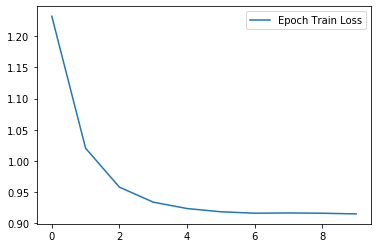

In [18]:
plt.plot(epochLossTrain, label = "Epoch Train Loss")
# plt.plot(epochLossValidate, label = "Epoch Validate Loss")
plt.legend(loc = "upper right")

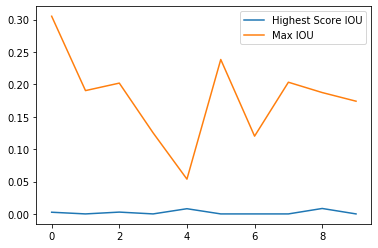

In [19]:
# plt.plot(epochLossTrain, label = "Epoch Train Loss")
plt.plot(epochAccBestScore, label = "Highest Score IOU")
plt.plot(epochAccValidate, label = "Max IOU")
plt.legend(loc = "upper right")

In [20]:
def get_prediction(img_path, threshold):
    img = Image.open(img_path) # Load the image
    transform = transforms.Compose([transforms.ToTensor()]) # Defing PyTorch Transform
    img = transform(img) # Apply the transform to the image
#     print(img)
    img = (img).float()
    model.eval()
    img = move_to(img,device)
    pred = model([img]) # Pass the image to the model
#     print(pred_class)
    pred_class = [classes[i] for i in list(pred[0]['labels'].cpu().numpy())] # Get the Prediction Score
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].cpu().detach().numpy())] # Bounding boxes
    pred_score = list(pred[0]['scores'].cpu().detach().numpy()) 
#     print(pred_score)
#     pred_score
#     pred_t = [pred_score.index(x) for x in pred_score if x >= threshold][-1] # Get list of index with score greater than threshold.
#     pred_boxes = pred_boxes[:pred_t+1]
#     pred_class = pred_class[:pred_t+1]
#     pred_score = pred_score[:pred_t+1]
    return pred_boxes, pred_class, pred_score

# to print all predictions in 1 image
# def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
#     boxes, pred_cls = get_prediction(img_path, threshold) # Get predictions
#     img = cv2.imread(img_path) # Read image with cv2
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
#     for i in range(len(boxes)):
#         print(boxes)
#         cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th) # Draw Rectangle with the coordinates
#         cv2.putText(img,pred_cls[i], boxes[i][0],  cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th) # Write the prediction class
#     plt.figure(figsize=(5,5)) # display the output image
#     plt.imshow(img)
#     plt.xticks([])
#     plt.yticks([])
#     plt.show()
#     return boxes
    
# path = "/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-IDRI-0001/01-01-2000-30178/3000566-03192/000003.png"

/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.
/home/ebc308/dl4med/lib/python3.7/site-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


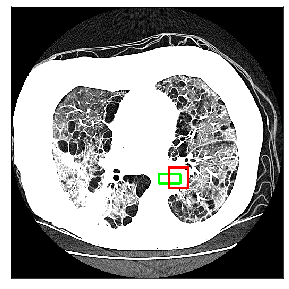

prediction box area:  709.9377 box area:  1404
highest score: 0.28800467  min:  0.12496704
predicted score: 0.15082157 iou: 0.22930102089187718


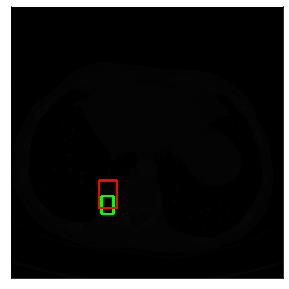

prediction box area:  729.6233 box area:  1768
highest score: 0.44359818  min:  0.19915517
predicted score: 0.21218467 iou: 0.2532022608758776


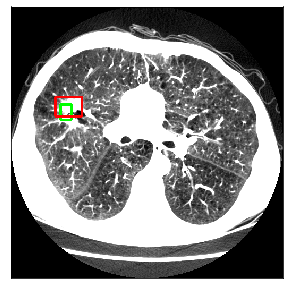

prediction box area:  565.84766 box area:  1800
highest score: 0.3916631  min:  0.15180258
predicted score: 0.1593439 iou: 0.23035572615579103


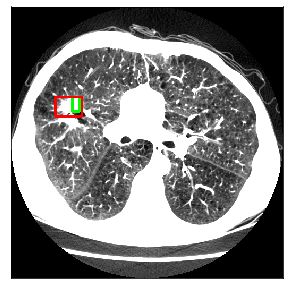

prediction box area:  401.7407 box area:  1800
highest score: 0.3916631  min:  0.15180258
predicted score: 0.15643558 iou: 0.23562493716497626


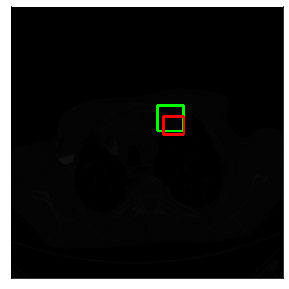

prediction box area:  2345.3328 box area:  1287
highest score: 0.28509057  min:  0.18280539
predicted score: 0.2351005 iou: 0.40853043103458836


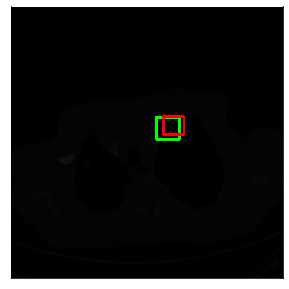

prediction box area:  1827.5133 box area:  1287
highest score: 0.28509057  min:  0.18280539
predicted score: 0.2062253 iou: 0.4816331126536021


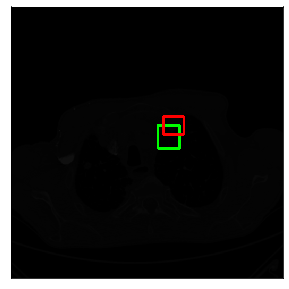

prediction box area:  1798.5929 box area:  1287
highest score: 0.28509057  min:  0.18280539
predicted score: 0.18904747 iou: 0.20958535266766895


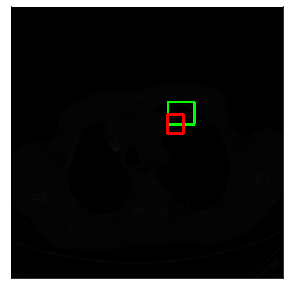

prediction box area:  2067.023 box area:  1080
highest score: 0.3155204  min:  0.17543818
predicted score: 0.23281603 iou: 0.20921927972712984


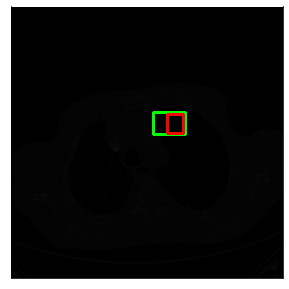

prediction box area:  2502.2683 box area:  1080
highest score: 0.3155204  min:  0.17543818
predicted score: 0.20587666 iou: 0.44027149457756626


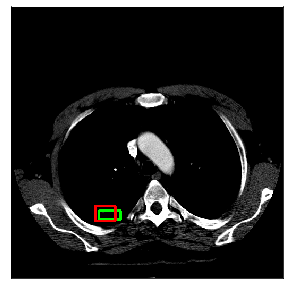

prediction box area:  656.8114 box area:  1064
highest score: 0.19074287  min:  0.07852047
predicted score: 0.10119102 iou: 0.4157828242688579


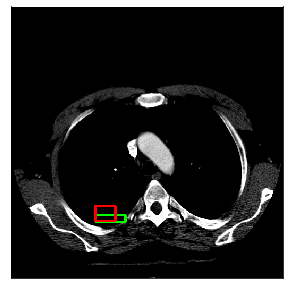

prediction box area:  697.6383 box area:  1064
highest score: 0.19074287  min:  0.07852047
predicted score: 0.09201206 iou: 0.29546740782601677


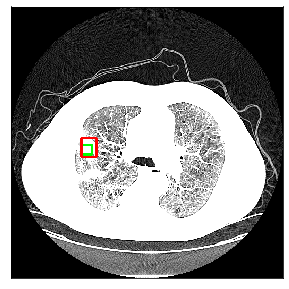

prediction box area:  367.7673 box area:  1008
highest score: 0.3120972  min:  0.11588636
predicted score: 0.12768462 iou: 0.3794263532248092


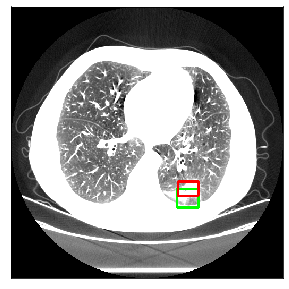

prediction box area:  1388.3702 box area:  1026
highest score: 0.44191578  min:  0.13296701
predicted score: 0.22255555 iou: 0.2589787061714013


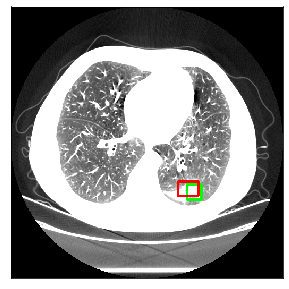

prediction box area:  790.5306 box area:  1026
highest score: 0.44191578  min:  0.13296701
predicted score: 0.19684666 iou: 0.3290985992487038


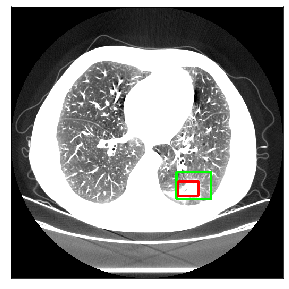

prediction box area:  3264.714 box area:  1026
highest score: 0.44191578  min:  0.13296701
predicted score: 0.1463064 iou: 0.32300075874469325


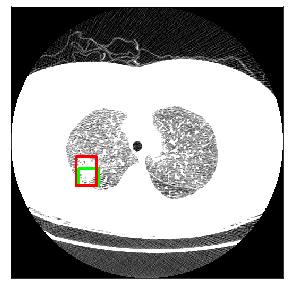

prediction box area:  1234.4742 box area:  2145
highest score: 0.37129205  min:  0.0501098
predicted score: 0.0732283 iou: 0.4874596522487533


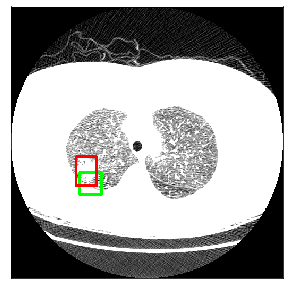

prediction box area:  1733.3938 box area:  2145
highest score: 0.37129205  min:  0.0501098
predicted score: 0.058763266 iou: 0.26624982748186876


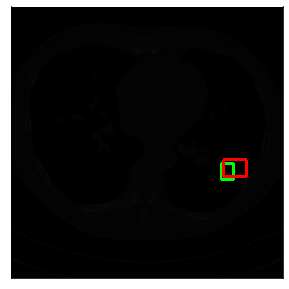

prediction box area:  692.0476 box area:  1333
highest score: 0.47348574  min:  0.22122903
predicted score: 0.2667824 iou: 0.2898165965380443


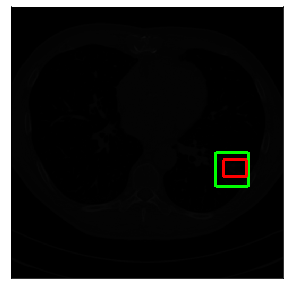

prediction box area:  3909.2244 box area:  1333
highest score: 0.47348574  min:  0.22122903
predicted score: 0.2545278 iou: 0.34891911833875955


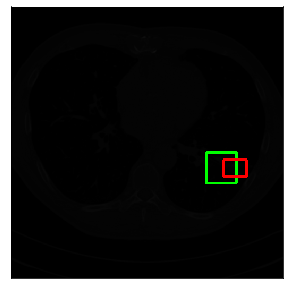

prediction box area:  3281.32 box area:  1333
highest score: 0.47348574  min:  0.22122903
predicted score: 0.24687153 iou: 0.20384413127966478


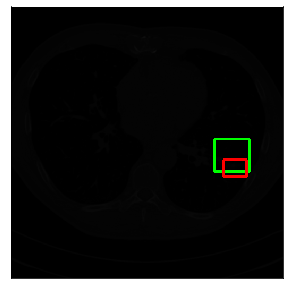

prediction box area:  3949.6445 box area:  1333
highest score: 0.47348574  min:  0.22122903
predicted score: 0.24291398 iou: 0.23273143773890456


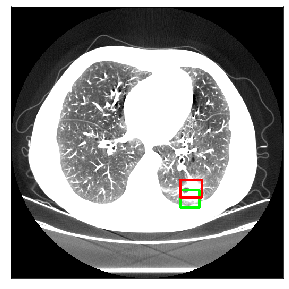

prediction box area:  1213.656 box area:  1353
highest score: 0.44297224  min:  0.13506925
predicted score: 0.23760918 iou: 0.2564118430205169


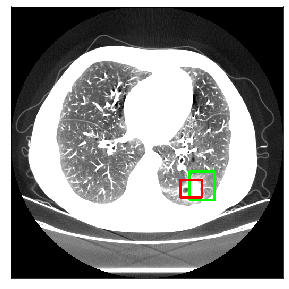

prediction box area:  2550.7483 box area:  1353
highest score: 0.44297224  min:  0.13506925
predicted score: 0.22565228 iou: 0.24748874599722692


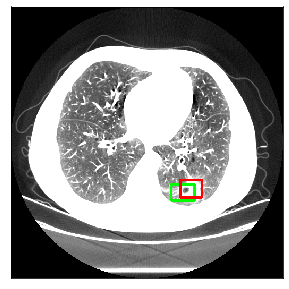

prediction box area:  1336.432 box area:  1353
highest score: 0.44297224  min:  0.13506925
predicted score: 0.19802134 iou: 0.33649962953874607


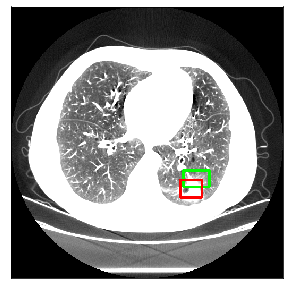

prediction box area:  1513.7465 box area:  1353
highest score: 0.44297224  min:  0.13506925
predicted score: 0.1602677 iou: 0.21179574463920967


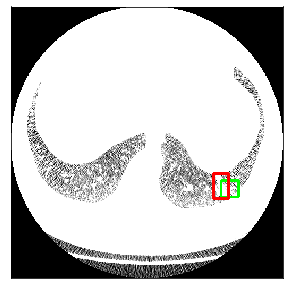

prediction box area:  1012.7526 box area:  1316
highest score: 0.25063354  min:  0.055404007
predicted score: 0.08473888 iou: 0.2243049992185052


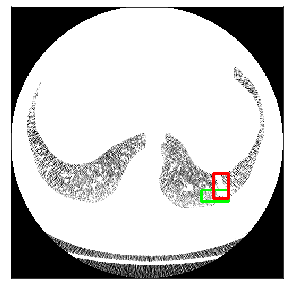

prediction box area:  1115.0942 box area:  1316
highest score: 0.25063354  min:  0.055404007
predicted score: 0.06134703 iou: 0.22832508117758984


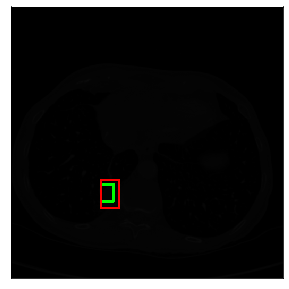

prediction box area:  753.7106 box area:  1802
highest score: 0.42125115  min:  0.20340098
predicted score: 0.21689937 iou: 0.4287276014737371


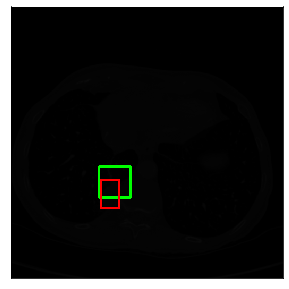

prediction box area:  3364.38 box area:  1802
highest score: 0.42125115  min:  0.20340098
predicted score: 0.20651476 iou: 0.28955813786890816


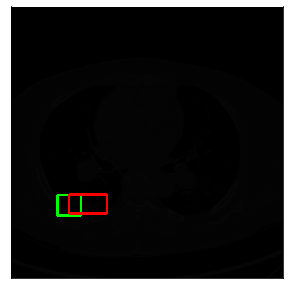

prediction box area:  1709.4884 box area:  2556
highest score: 0.29595262  min:  0.21907862
predicted score: 0.22801864 iou: 0.2321225892383515


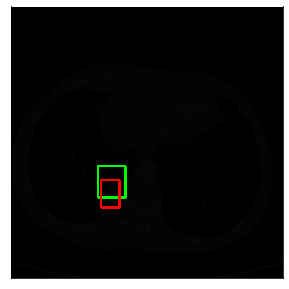

prediction box area:  3056.7883 box area:  1820
highest score: 0.42417806  min:  0.21013017
predicted score: 0.23026645 iou: 0.3198498833715539


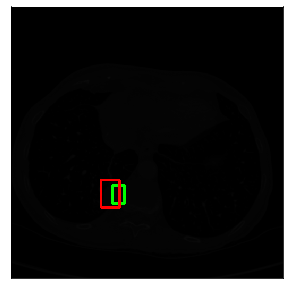

prediction box area:  711.5155 box area:  1820
highest score: 0.42417806  min:  0.21013017
predicted score: 0.21227759 iou: 0.20333411959738765


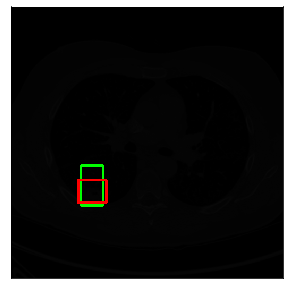

prediction box area:  3181.2366 box area:  2279
highest score: 0.4940962  min:  0.21610954
predicted score: 0.21737775 iou: 0.5077390658858856


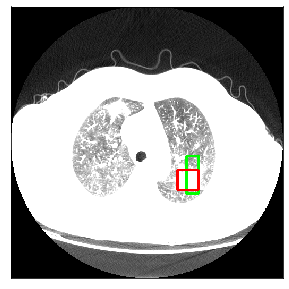

prediction box area:  1637.7269 box area:  1482
highest score: 0.43331072  min:  0.08142268
predicted score: 0.104459606 iou: 0.3675900566619293


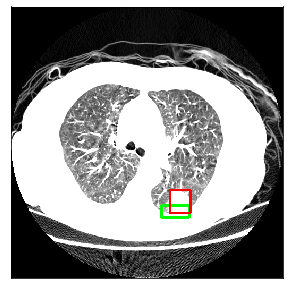

prediction box area:  1199.1573 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.16250394 iou: 0.21767229227336693


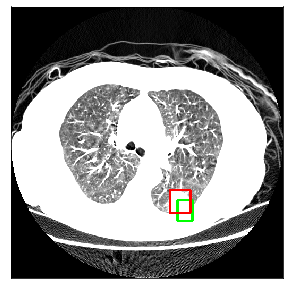

prediction box area:  1043.506 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.16160184 iou: 0.2596353516260123


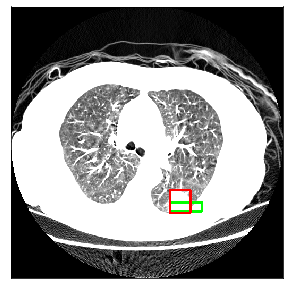

prediction box area:  983.1542 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.14574088 iou: 0.31547791084251164


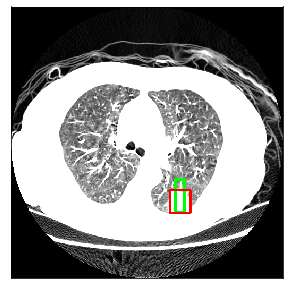

prediction box area:  1117.1681 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.107329205 iou: 0.39494998506325146


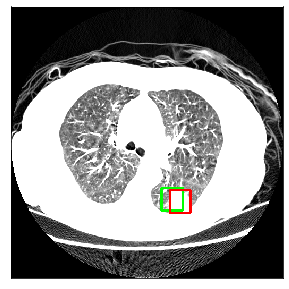

prediction box area:  1721.0251 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.106077775 iou: 0.4057763285712799


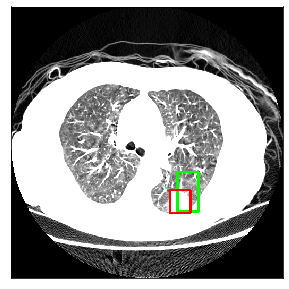

prediction box area:  2843.9836 box area:  1634
highest score: 0.2829967  min:  0.10294441
predicted score: 0.10416896 iou: 0.2794623392789038


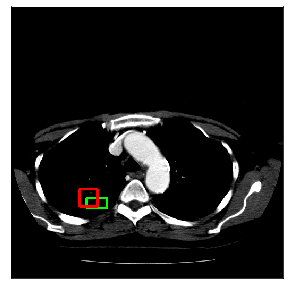

prediction box area:  710.1445 box area:  1089
highest score: 0.246308  min:  0.0714749
predicted score: 0.13473192 iou: 0.20614556237284629


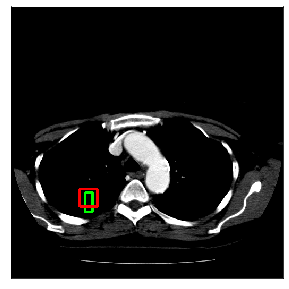

prediction box area:  524.06665 box area:  1089
highest score: 0.246308  min:  0.0714749
predicted score: 0.100309074 iou: 0.31272274261071575


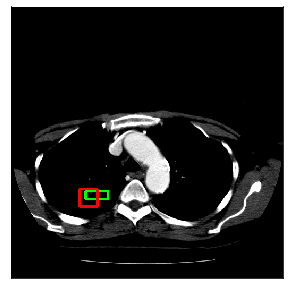

prediction box area:  615.7026 box area:  1089
highest score: 0.246308  min:  0.0714749
predicted score: 0.09088852 iou: 0.2388299533434946


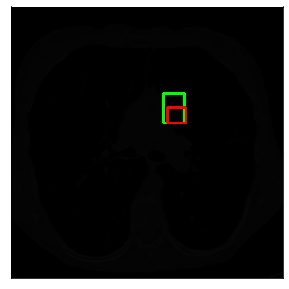

prediction box area:  2197.8503 box area:  1015
highest score: 0.39341813  min:  0.22517738
predicted score: 0.23431832 iou: 0.42994224071535764


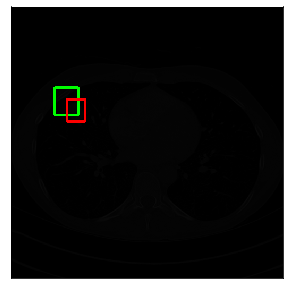

prediction box area:  2305.747 box area:  1428
highest score: 0.4940962  min:  0.23525484
predicted score: 0.2454894 iou: 0.22329046387326307


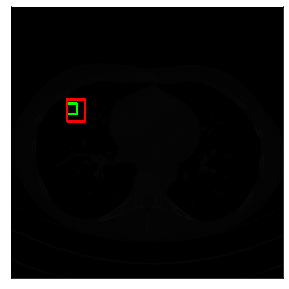

prediction box area:  388.80676 box area:  1428
highest score: 0.4940962  min:  0.23525484
predicted score: 0.24317709 iou: 0.2852222659137793


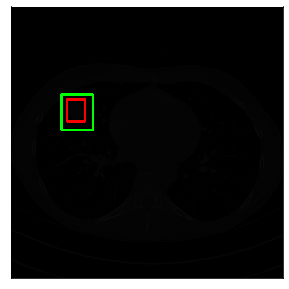

prediction box area:  3921.5933 box area:  1428
highest score: 0.4940962  min:  0.23525484
predicted score: 0.239744 iou: 0.37177484987200665


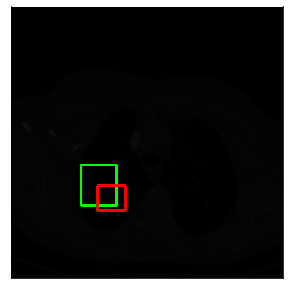

prediction box area:  5007.0645 box area:  2491
highest score: 0.29937893  min:  0.21117105
predicted score: 0.21392225 iou: 0.22319351699251763


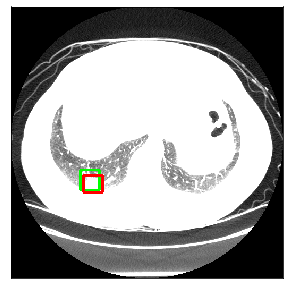

prediction box area:  1374.2776 box area:  1116
highest score: 0.20050906  min:  0.07587525
predicted score: 0.09741237 iou: 0.5077365756165346


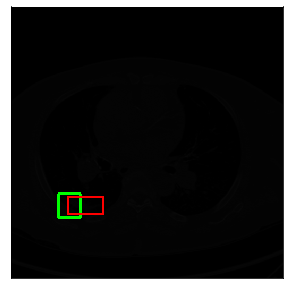

prediction box area:  1849.7828 box area:  2112
highest score: 0.4940962  min:  0.21796392
predicted score: 0.22799617 iou: 0.24505342300139407


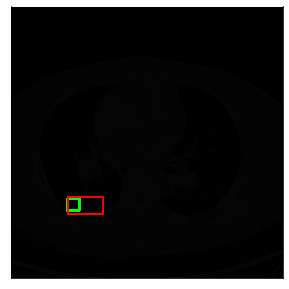

prediction box area:  535.55316 box area:  2112
highest score: 0.4940962  min:  0.21796392
predicted score: 0.22639786 iou: 0.24728198005497132


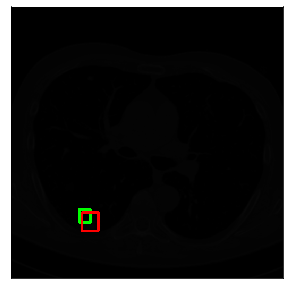

prediction box area:  535.6928 box area:  1085
highest score: 0.29039243  min:  0.20601527
predicted score: 0.22170998 iou: 0.26746172761599357


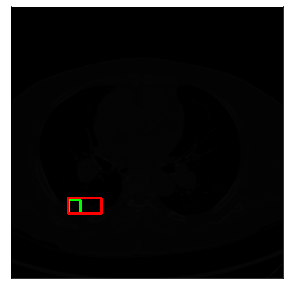

prediction box area:  557.75696 box area:  1827
highest score: 0.4466763  min:  0.21899751
predicted score: 0.23484184 iou: 0.299884641031123


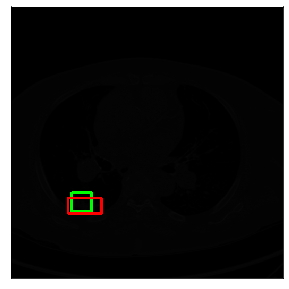

prediction box area:  1266.1508 box area:  1827
highest score: 0.4466763  min:  0.21899751
predicted score: 0.22565272 iou: 0.42830649382217956


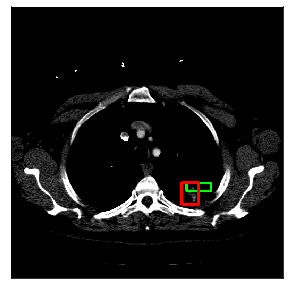

prediction box area:  712.87726 box area:  1271
highest score: 0.22525871  min:  0.082423866
predicted score: 0.10220217 iou: 0.2126242210918628


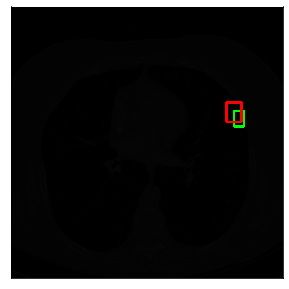

prediction box area:  574.47705 box area:  1036
highest score: 0.44561106  min:  0.23814984
predicted score: 0.25042757 iou: 0.22330894759189504


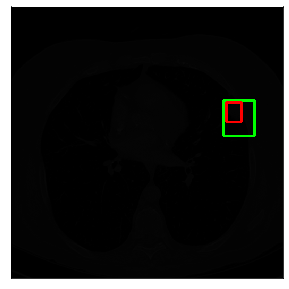

prediction box area:  3870.879 box area:  1036
highest score: 0.44561106  min:  0.23814984
predicted score: 0.24615 iou: 0.2757270183539252


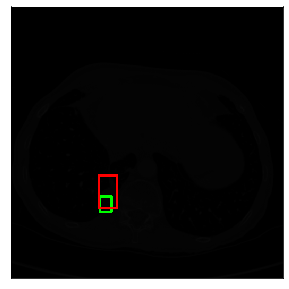

prediction box area:  621.8579 box area:  2108
highest score: 0.4611277  min:  0.20388716
predicted score: 0.24287613 iou: 0.21043851034525451


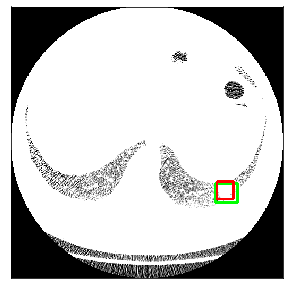

prediction box area:  1452.8477 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.105314456 iou: 0.5546331051666359


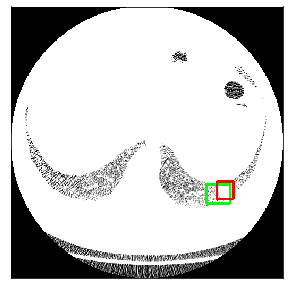

prediction box area:  1628.8652 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.10001086 iou: 0.3627980732604802


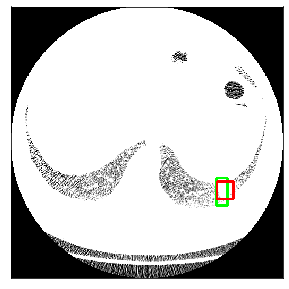

prediction box area:  1088.2291 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.094552174 iou: 0.4744259663430141


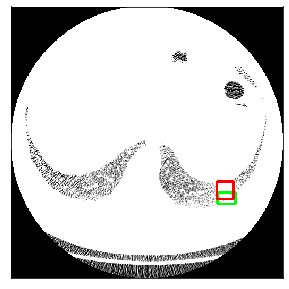

prediction box area:  684.8886 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.08633361 iou: 0.258965474749383


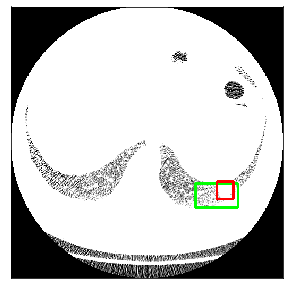

prediction box area:  3617.6023 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.08117072 iou: 0.24463870567654364


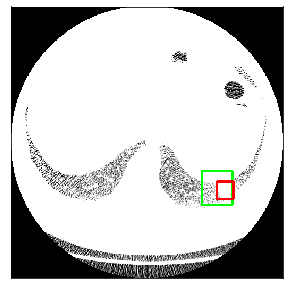

prediction box area:  3656.0662 box area:  1023
highest score: 0.22970784  min:  0.050067447
predicted score: 0.068056755 iou: 0.270851067814003


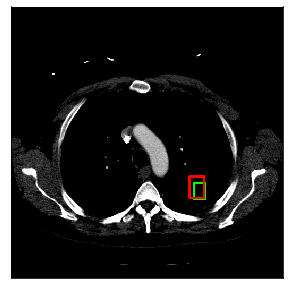

prediction box area:  616.9998 box area:  1107
highest score: 0.32904977  min:  0.07446002
predicted score: 0.11783482 iou: 0.42889914561139814


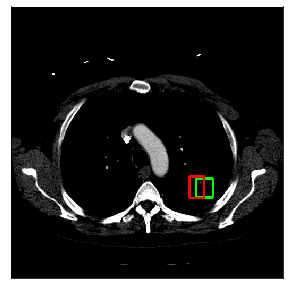

prediction box area:  1140.4014 box area:  1107
highest score: 0.32904977  min:  0.07446002
predicted score: 0.09076395 iou: 0.31697054218423915


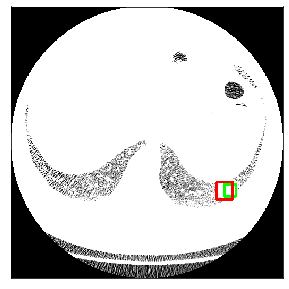

prediction box area:  489.77005 box area:  1023
highest score: 0.24650426  min:  0.050348047
predicted score: 0.08296384 iou: 0.3058644597727463


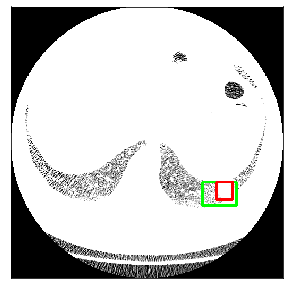

prediction box area:  2757.9453 box area:  1023
highest score: 0.24650426  min:  0.050348047
predicted score: 0.067584574 iou: 0.3697574730553925


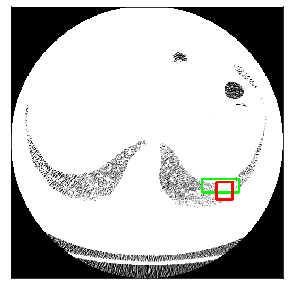

prediction box area:  1774.6604 box area:  1023
highest score: 0.24650426  min:  0.050348047
predicted score: 0.054658517 iou: 0.2843594812624372


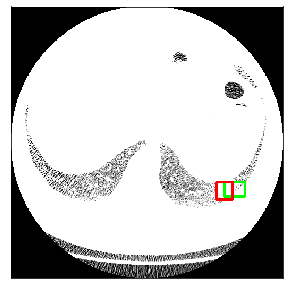

prediction box area:  1048.5665 box area:  1023
highest score: 0.24650426  min:  0.050348047
predicted score: 0.05443632 iou: 0.26986908975852464


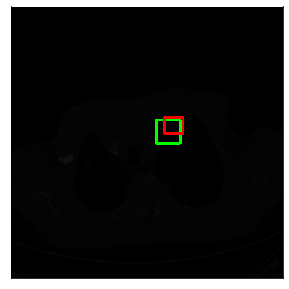

prediction box area:  1958.3638 box area:  1054
highest score: 0.3287876  min:  0.1742949
predicted score: 0.19133565 iou: 0.3471123495628063


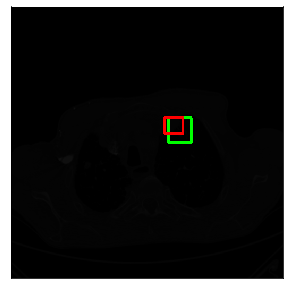

prediction box area:  2005.2803 box area:  1054
highest score: 0.3287876  min:  0.1742949
predicted score: 0.17583008 iou: 0.3522054339594771


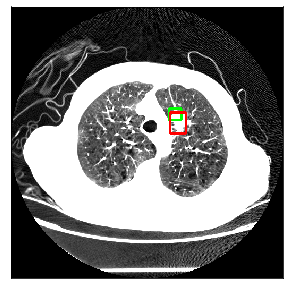

prediction box area:  482.5508 box area:  1170
highest score: 0.2680071  min:  0.121864595
predicted score: 0.1277625 iou: 0.2397280715611838


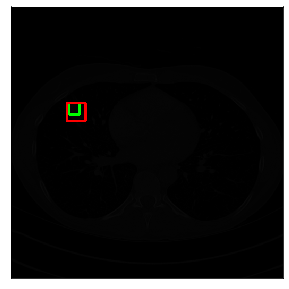

prediction box area:  414.12857 box area:  1190
highest score: 0.45313656  min:  0.24007802
predicted score: 0.25079617 iou: 0.3618300369860316


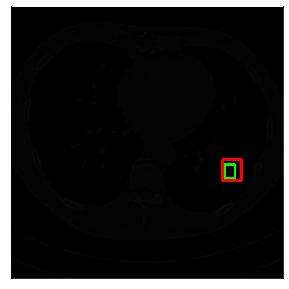

prediction box area:  498.1546 box area:  1404
highest score: 0.4071917  min:  0.23853283
predicted score: 0.2745073 iou: 0.3676295763649349


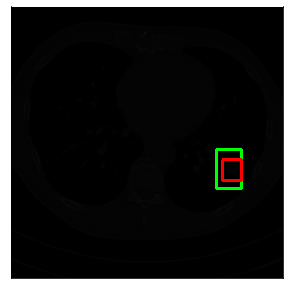

prediction box area:  3402.1118 box area:  1404
highest score: 0.4071917  min:  0.23853283
predicted score: 0.25983086 iou: 0.40769442443286835


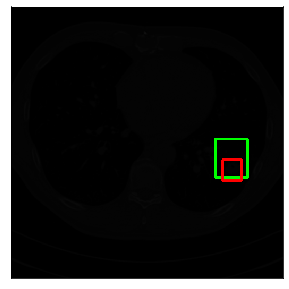

prediction box area:  4431.5312 box area:  1404
highest score: 0.4071917  min:  0.23853283
predicted score: 0.25669238 iou: 0.2714135269694089


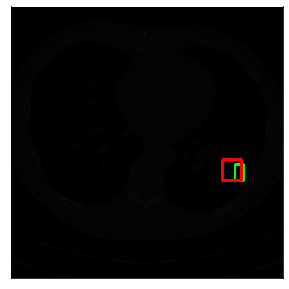

prediction box area:  507.8408 box area:  1404
highest score: 0.4071917  min:  0.23853283
predicted score: 0.24386485 iou: 0.2588519472517235


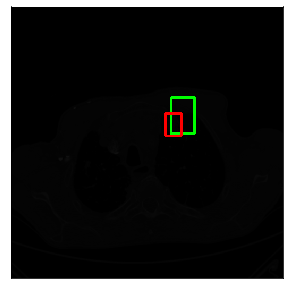

prediction box area:  3022.3687 box area:  1260
highest score: 0.28274634  min:  0.16464877
predicted score: 0.26470217 iou: 0.20921445489356133


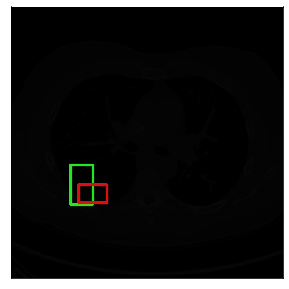

prediction box area:  3193.9346 box area:  1802
highest score: 0.4074769  min:  0.21458595
predicted score: 0.22403061 iou: 0.23719401903035062


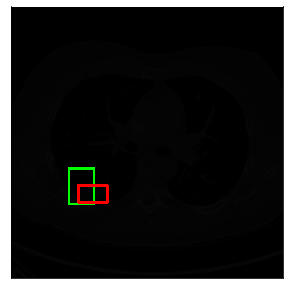

prediction box area:  3079.6245 box area:  1760
highest score: 0.37904695  min:  0.22060694
predicted score: 0.23281163 iou: 0.2560516456707304


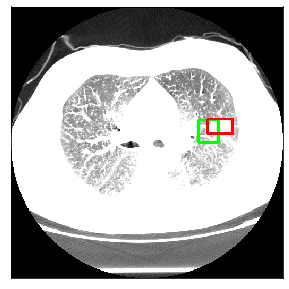

prediction box area:  1571.0371 box area:  1316
highest score: 0.24121113  min:  0.07754333
predicted score: 0.084485635 iou: 0.21934691197033257


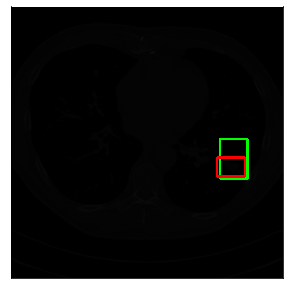

prediction box area:  3845.277 box area:  1855
highest score: 0.39217332  min:  0.20956072
predicted score: 0.23807694 iou: 0.40821109493587787


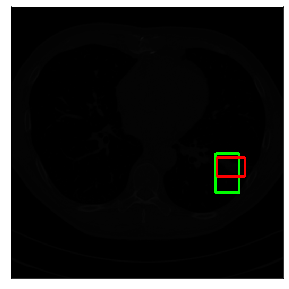

prediction box area:  3294.4495 box area:  1855
highest score: 0.39217332  min:  0.20956072
predicted score: 0.2334536 iou: 0.4159438769119604


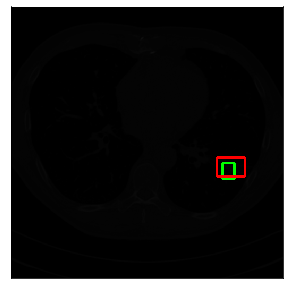

prediction box area:  643.4048 box area:  1855
highest score: 0.39217332  min:  0.20956072
predicted score: 0.23310252 iou: 0.2780358306166114


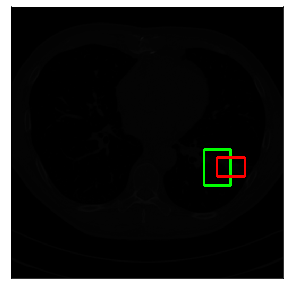

prediction box area:  3319.0288 box area:  1855
highest score: 0.39217332  min:  0.20956072
predicted score: 0.2294576 iou: 0.22762552724890397


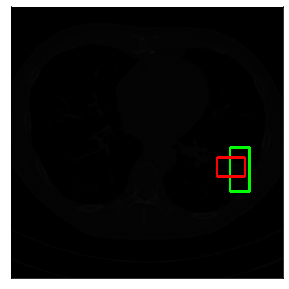

prediction box area:  2966.4338 box area:  1855
highest score: 0.39217332  min:  0.20956072
predicted score: 0.21024722 iou: 0.25619366451313025


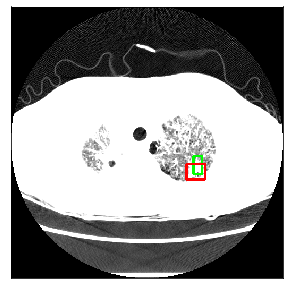

prediction box area:  539.5386 box area:  1015
highest score: 0.22331177  min:  0.06939281
predicted score: 0.12984234 iou: 0.2659119663358872


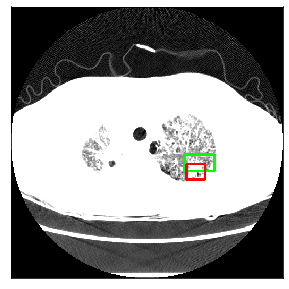

prediction box area:  1741.6909 box area:  1015
highest score: 0.22331177  min:  0.06939281
predicted score: 0.11876922 iou: 0.22079041628289478


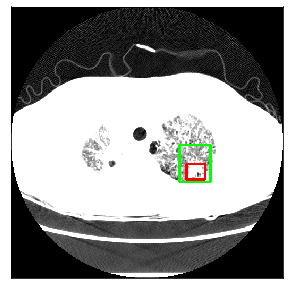

prediction box area:  4043.9404 box area:  1015
highest score: 0.22331177  min:  0.06939281
predicted score: 0.07575371 iou: 0.25882329348060173


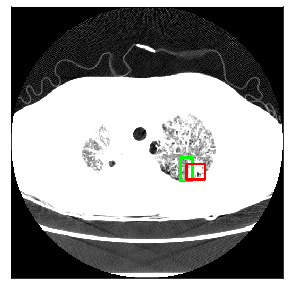

prediction box area:  993.69226 box area:  1015
highest score: 0.22331177  min:  0.06939281
predicted score: 0.07511536 iou: 0.21285257124625123


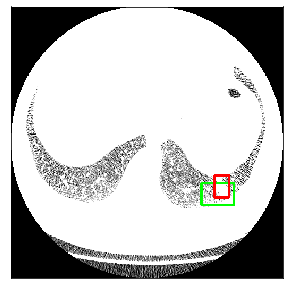

prediction box area:  2504.474 box area:  1134
highest score: 0.24988288  min:  0.05635001
predicted score: 0.057345696 iou: 0.25206460531289
92 96


In [21]:
count = 0
for index, row in test_data.iterrows():
    path = row.path
    boxes = row.boxes
    boxes = ast.literal_eval(boxes)
    list_box = []
    for i in boxes:
        #xmin #ymax #xmax #ymin
        list_box.append(i[0]) #xmin
        list_box.append(i[1]) #ymin
        list_box.append(i[2]) #xmax
        list_box.append(i[3]) #ymax
        ymin, ymax = int(i[1]),int(i[3]) #ymin ymax        
        xmin, xmax = int(i[0]), int(i[2]) #xmin, xmax

    box, pred_cls, pred_score = get_prediction(path, 0.0)#threshold very low
    pred_boxes = [[i[0][0], i[0][1], i[1][0], i[1][1]] for i in list(box)] # Bounding boxes

    img = cv2.imread(path) # Read image with cv2
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
    for i, ind in enumerate(pred_boxes):
        if (bb_intersection_over_union((list_box),(ind)) > .2):
            count += 1
            img = cv2.imread(path) # Read image with cv2
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
            cv2.rectangle(img, (ind[0], ind[1]),(ind[2], ind[3]),color=(0, 255, 0), thickness=3)
            cv2.rectangle(img, (xmin, ymin),(xmax, ymax),color=(255, 0, 0), thickness=3)
            plt.figure(figsize=(5,5)) # display the output image
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.show()   
            print("prediction box area: ", (ind[2] - ind[0]) * (ind[3] - ind[1]), "box area: ", (xmax - xmin) * (ymax - ymin))
            print("highest score:" ,max(pred_score), " min: ", min(pred_score))
            print("predicted score:" , pred_score[i], "iou:", bb_intersection_over_union((list_box),(ind)))
            
print(count, len(test_data))

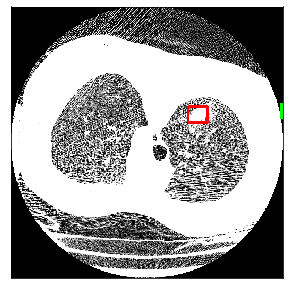

prediction box area:  84.177055
0.0


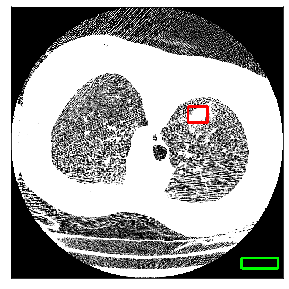

prediction box area:  1341.3201
0.0


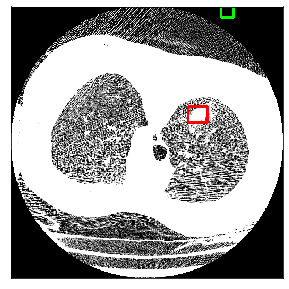

prediction box area:  486.4091
0.0


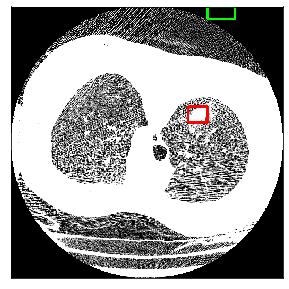

prediction box area:  1236.1406
0.0


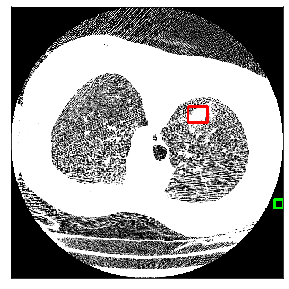

prediction box area:  271.36783
0.0


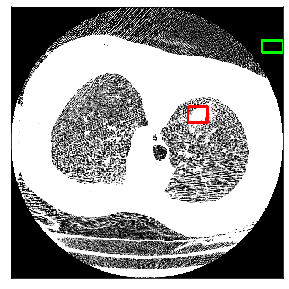

prediction box area:  909.03357
0.0


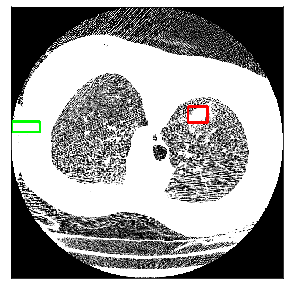

prediction box area:  1068.452
0.0


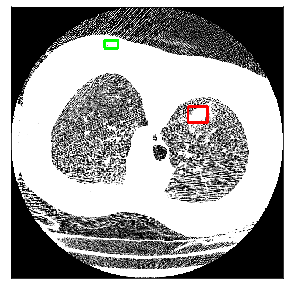

prediction box area:  385.52975
0.0


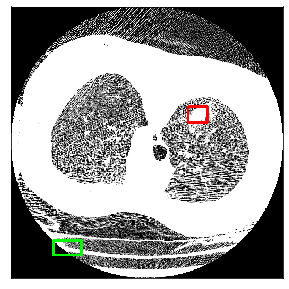

prediction box area:  1429.6328
0.0


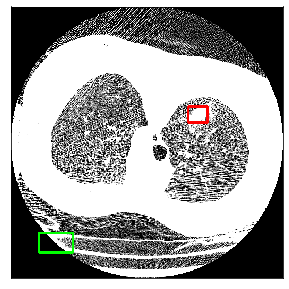

prediction box area:  2320.162
0.0


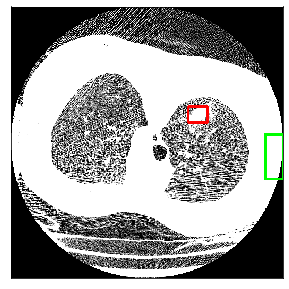

prediction box area:  2809.7136
0.0


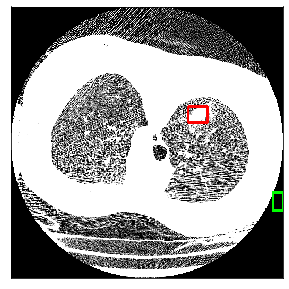

prediction box area:  658.61176
0.0


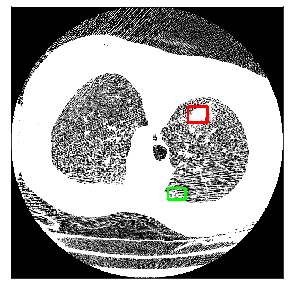

prediction box area:  701.74005
0.0


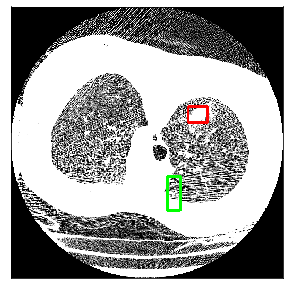

prediction box area:  1520.2537
0.0


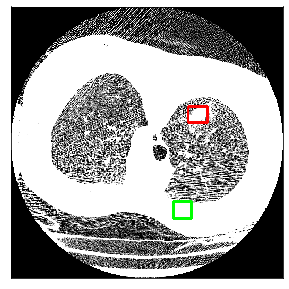

prediction box area:  1085.6268
0.0


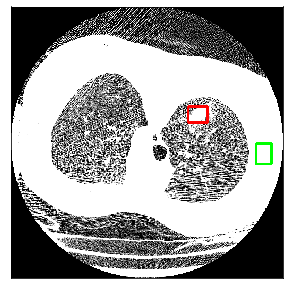

prediction box area:  1097.7747
0.0


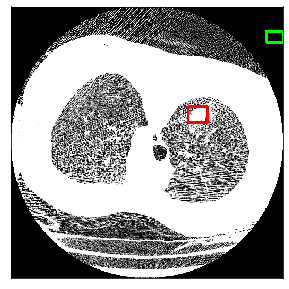

prediction box area:  666.6383
0.0


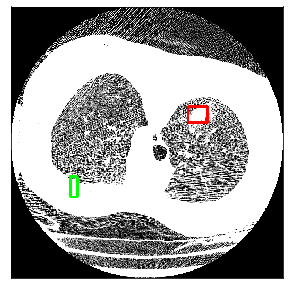

prediction box area:  503.35422
0.0


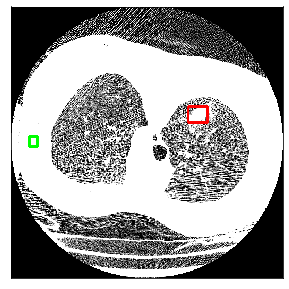

prediction box area:  307.46317
0.0


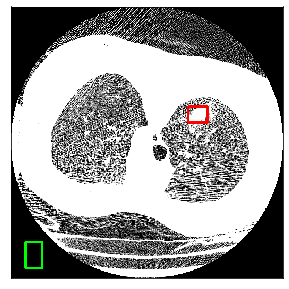

prediction box area:  1484.1898
0.0


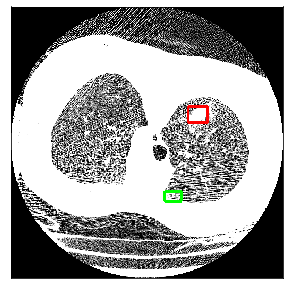

prediction box area:  557.06915
0.0


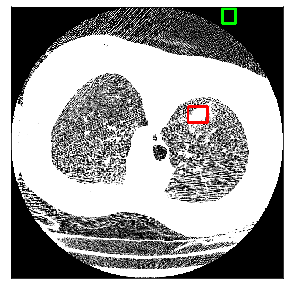

prediction box area:  647.5603
0.0


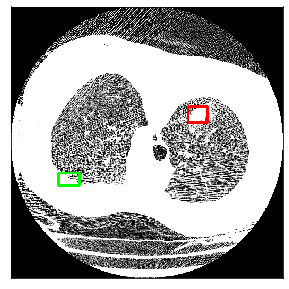

prediction box area:  934.9441
0.0


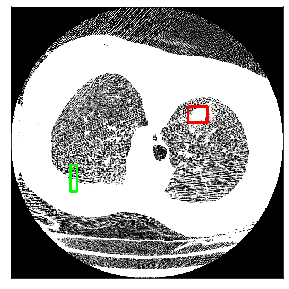

prediction box area:  624.59576
0.0


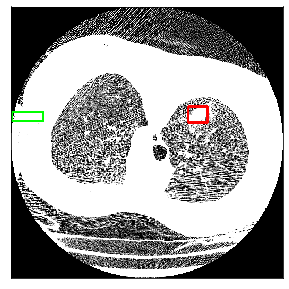

prediction box area:  1073.6615
0.0


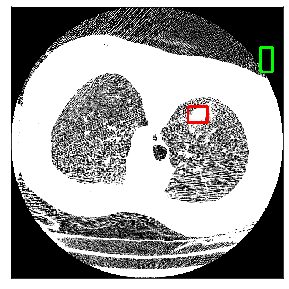

prediction box area:  1055.4117
0.0


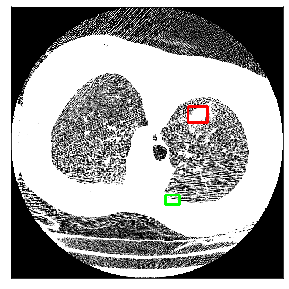

prediction box area:  509.24063
0.0


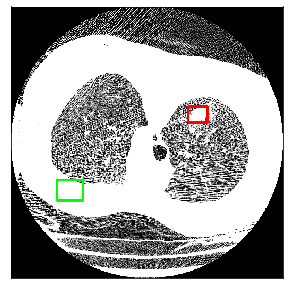

prediction box area:  1930.0869
0.0


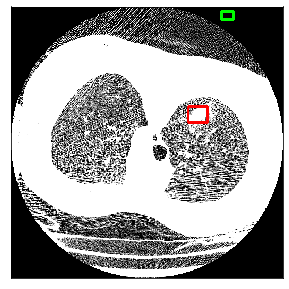

prediction box area:  327.0254
0.0


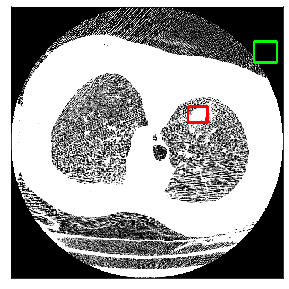

prediction box area:  1748.1969
0.0


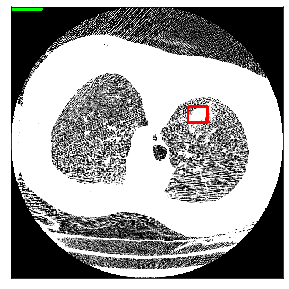

prediction box area:  376.5275
0.0


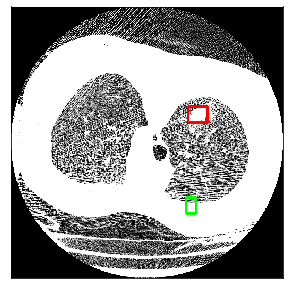

prediction box area:  584.2741
0.0


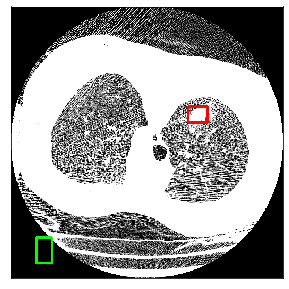

prediction box area:  1435.7974
0.0


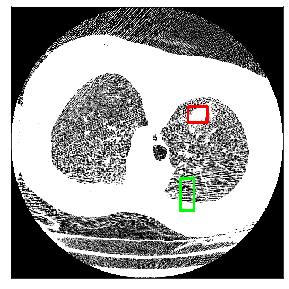

prediction box area:  1625.7687
0.0


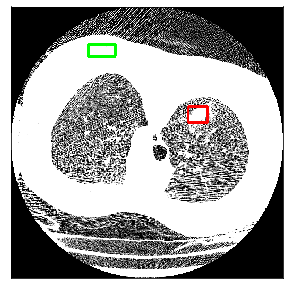

prediction box area:  1121.7988
0.0


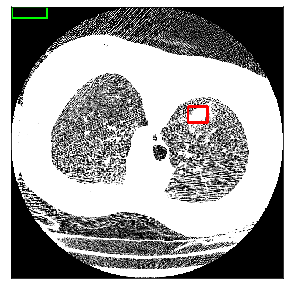

prediction box area:  1446.4362
0.0


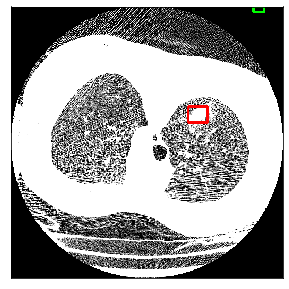

prediction box area:  225.16739
0.0


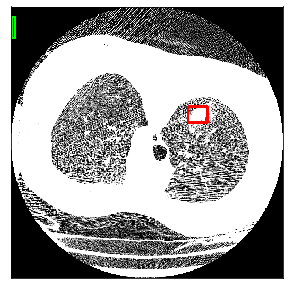

prediction box area:  291.10983
0.0


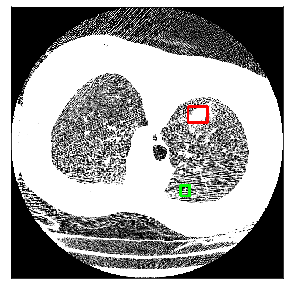

prediction box area:  342.58664
0.0


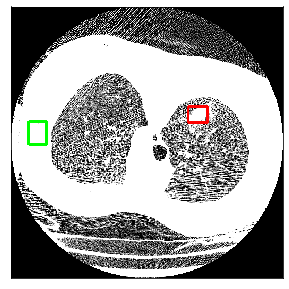

prediction box area:  1416.7902
0.0


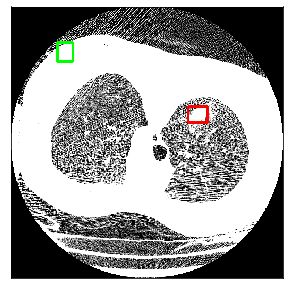

prediction box area:  1068.3397
0.0


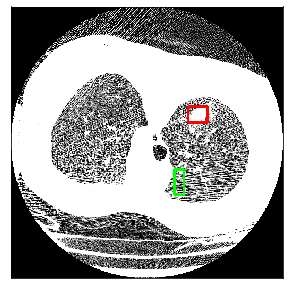

prediction box area:  854.06195
0.0


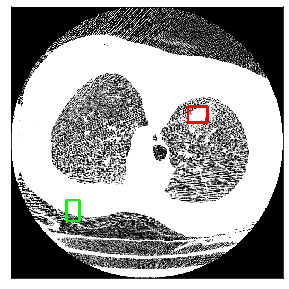

prediction box area:  971.57526
0.0


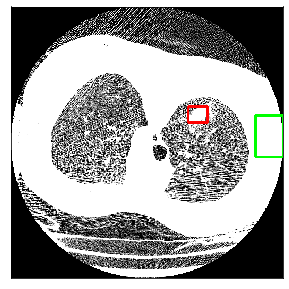

prediction box area:  3977.2588
0.0


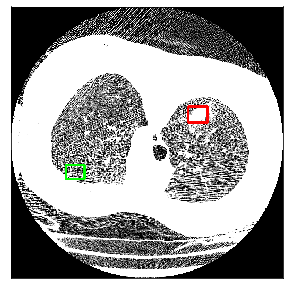

prediction box area:  928.82153
0.0


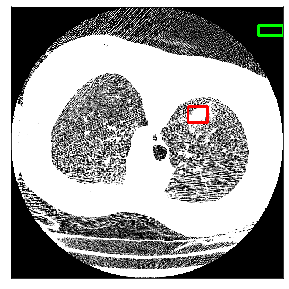

prediction box area:  871.02136
0.0


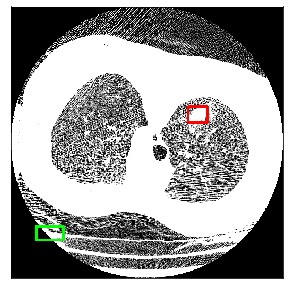

prediction box area:  1310.9495
0.0


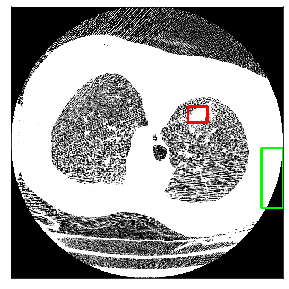

prediction box area:  4578.0244
0.0


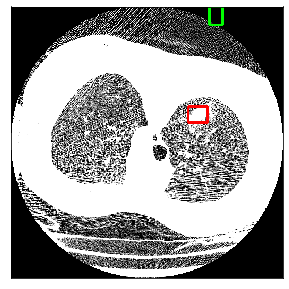

prediction box area:  866.61346
0.0


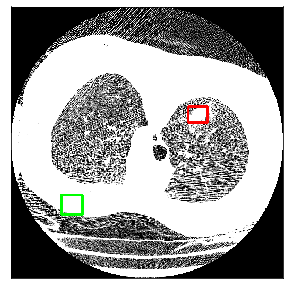

prediction box area:  1465.3031
0.0


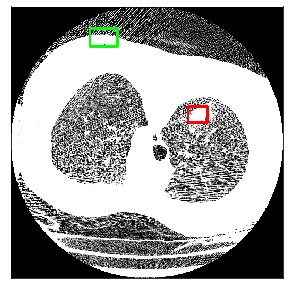

prediction box area:  1772.956
0.0


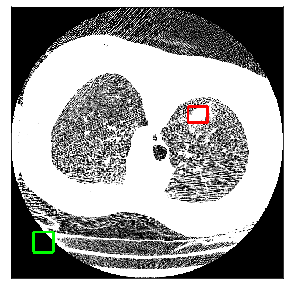

prediction box area:  1419.1097
0.0


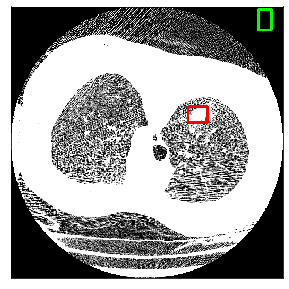

prediction box area:  979.3166
0.0


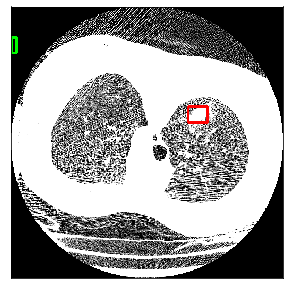

prediction box area:  296.3099
0.0


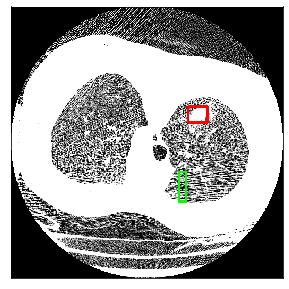

prediction box area:  744.6231
0.0


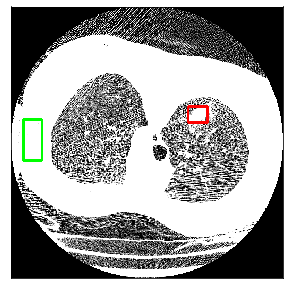

prediction box area:  2699.6482
0.0


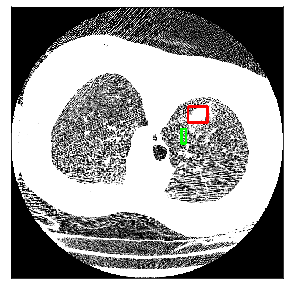

prediction box area:  225.3165
0.0


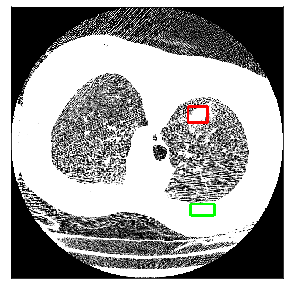

prediction box area:  981.63165
0.0


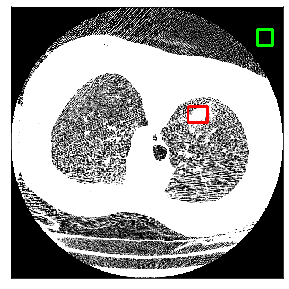

prediction box area:  867.4593
0.0


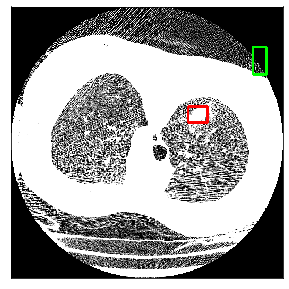

prediction box area:  1254.5819
0.0


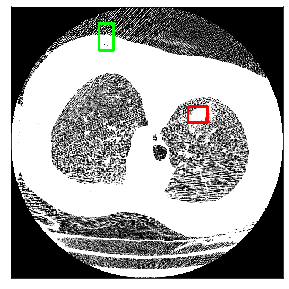

prediction box area:  1431.2859
0.0


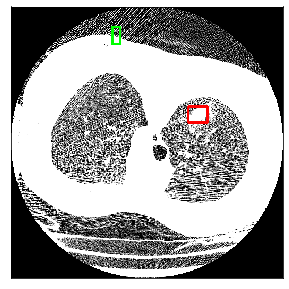

prediction box area:  482.5407
0.0


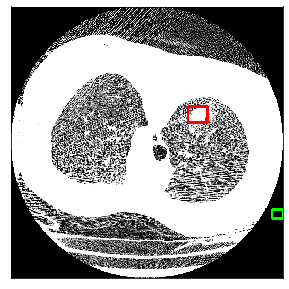

prediction box area:  322.6755
0.0


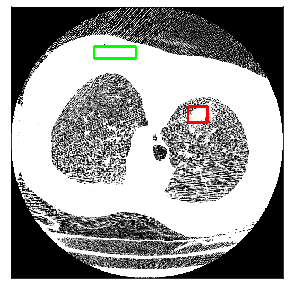

prediction box area:  1810.8341
0.0


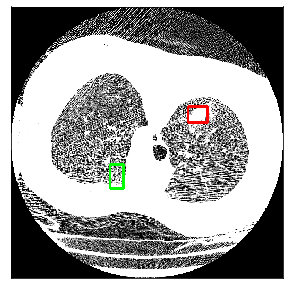

prediction box area:  1124.3286
0.0


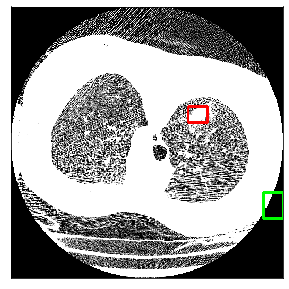

prediction box area:  1831.6073
0.0


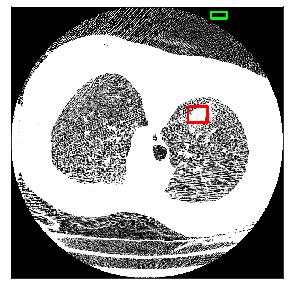

prediction box area:  342.52432
0.0


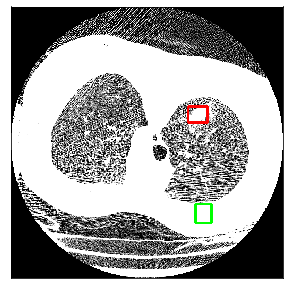

prediction box area:  1096.2196
0.0


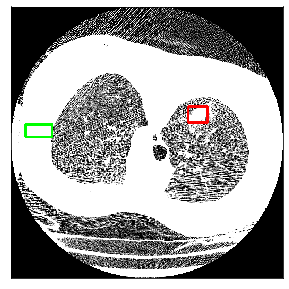

prediction box area:  1228.7661
0.0


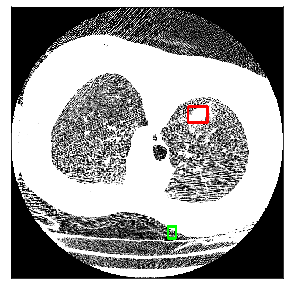

prediction box area:  367.27264
0.0


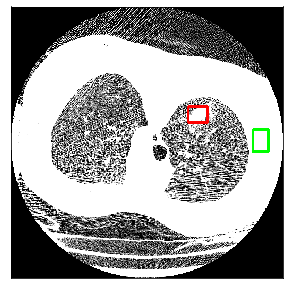

prediction box area:  1253.0481
0.0


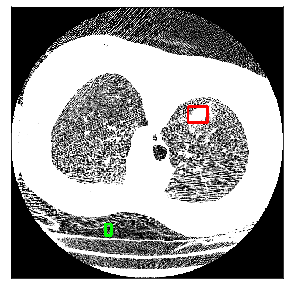

prediction box area:  258.16855
0.0


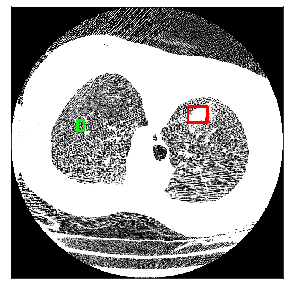

prediction box area:  253.38498
0.0


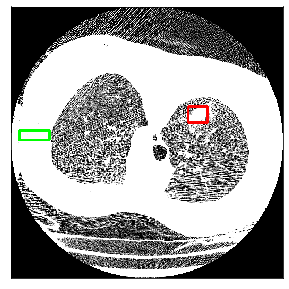

prediction box area:  1042.4255
0.0


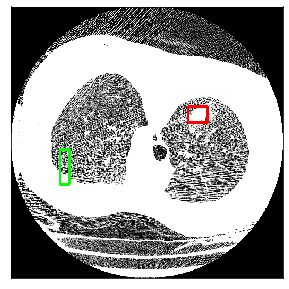

prediction box area:  1174.3531
0.0


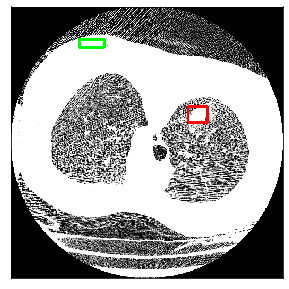

prediction box area:  728.83923
0.0


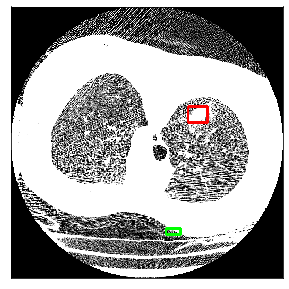

prediction box area:  341.44226
0.0


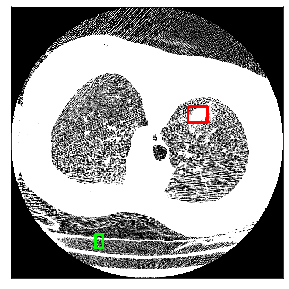

prediction box area:  372.40027
0.0


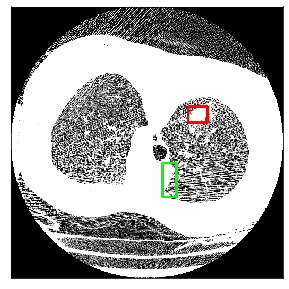

prediction box area:  1698.6833
0.0


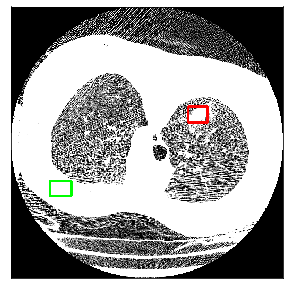

prediction box area:  1118.3694
0.0


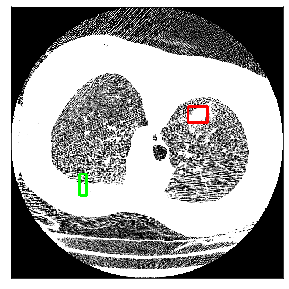

prediction box area:  525.79376
0.0


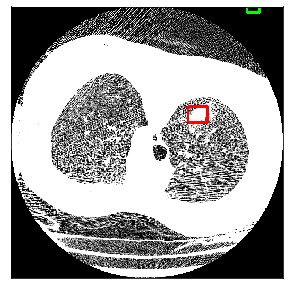

prediction box area:  273.78278
0.0


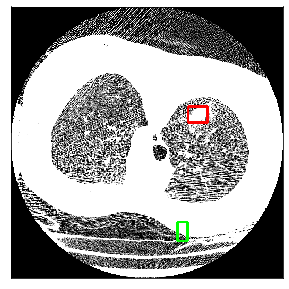

prediction box area:  694.3929
0.0


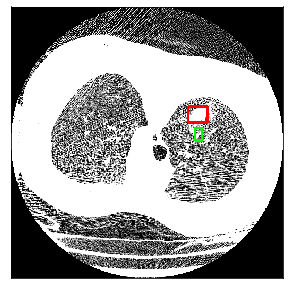

prediction box area:  297.83243
0.0


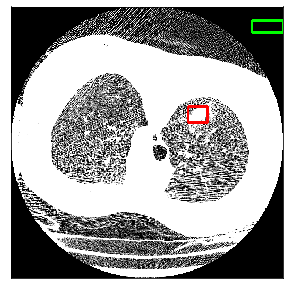

prediction box area:  1270.375
0.0


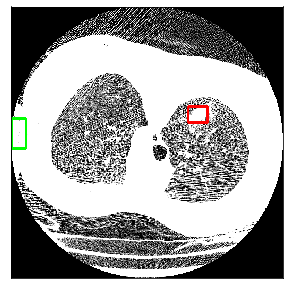

prediction box area:  1601.594
0.0


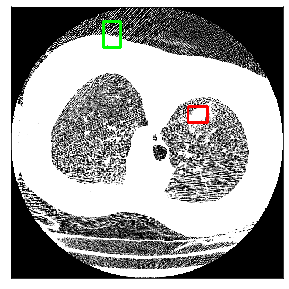

prediction box area:  1552.8258
0.0


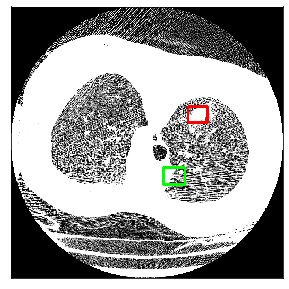

prediction box area:  1242.2716
0.0


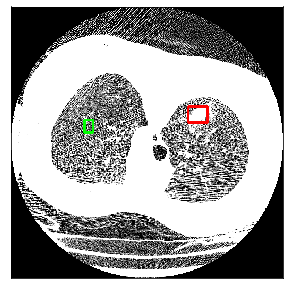

prediction box area:  367.2663
0.0


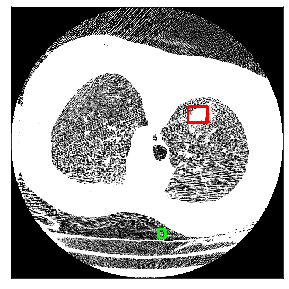

prediction box area:  214.40152
0.0


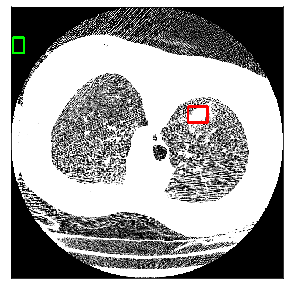

prediction box area:  597.57935
0.0


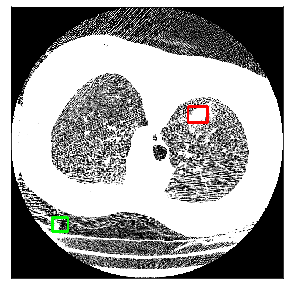

prediction box area:  775.77826
0.0


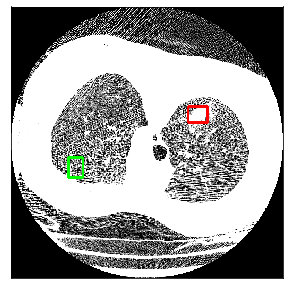

prediction box area:  996.73114
0.0


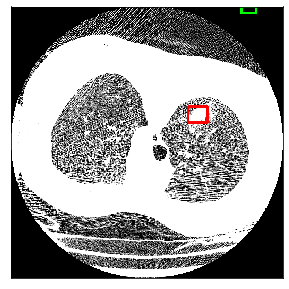

prediction box area:  358.31693
0.0


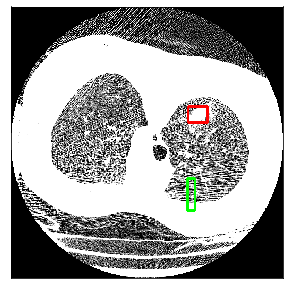

prediction box area:  801.83295
0.0


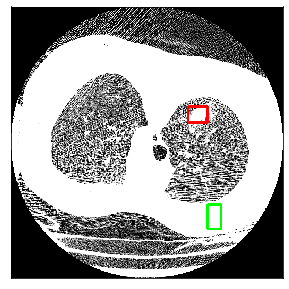

prediction box area:  1117.6702
0.0


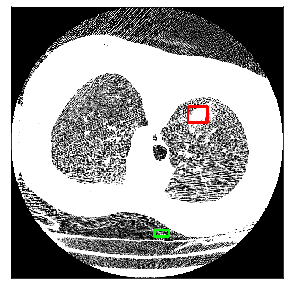

prediction box area:  338.32477
0.0


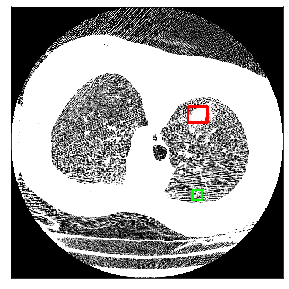

prediction box area:  346.65378
0.0


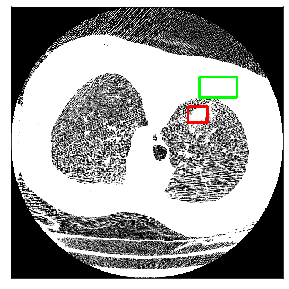

prediction box area:  2803.3281
0.0


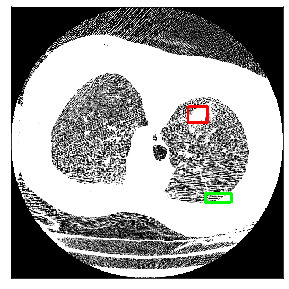

prediction box area:  776.18256
0.0


In [23]:
# print one instance

path = df.iloc[2,0]
boxes = df.iloc[2,3]

# path = '/scratch/ebc308/tcia/data_png/LIDC-IDRI/LIDC-IDRI-0001/01-01-2000-30178/3000566-03192/000030.png'
# boxes = "[[302.0, 351.0, 329.0, 384.0]]"
# print(boxes)

# print each prediction along with correct bounding box
boxes = ast.literal_eval(boxes)
list_box = []
for i in boxes:
    #xmin #ymax #xmax #ymin
    list_box.append(i[0]) #xmin
    list_box.append(i[1]) #ymin
    list_box.append(i[2]) #xmax
    list_box.append(i[3]) #ymax
    ymin, ymax = int(i[1]),int(i[3]) #ymin ymax        
    xmin, xmax = int(i[0]), int(i[2]) #xmin, xmax

box, pred_cls, pred_score = get_prediction(path, 0.2)
pred_boxes = [[i[0][0], i[0][1], i[1][0], i[1][1]] for i in list(box)] # Bounding boxes

img = cv2.imread(path) # Read image with cv2
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
for ind in pred_boxes:
    img = cv2.imread(path) # Read image with cv2
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
    cv2.rectangle(img, (ind[0], ind[1]),(ind[2], ind[3]),color=(0, 255, 0), thickness=3)
    cv2.rectangle(img, (xmin, ymin),(xmax, ymax),color=(255, 0, 0), thickness=3)
    plt.figure(figsize=(5,5)) # display the output image
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()   
    print("prediction box area: ", (ind[2] - ind[0]) * (ind[3] - ind[1]))
    print(bb_intersection_over_union((list_box),(ind) ))